In [1]:
!pip install --upgrade fastprogress fastai



[notice] A new release of pip is available: 23.2.1 -> 26.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
!pip install ddgs


[notice] A new release of pip is available: 23.2.1 -> 26.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
from ddgs import DDGS #DuckDuckGo has changed the api so we need to update 
from fastcore.all import *

def search_images(keywords, max_images=200): return L(DDGS().images(keywords, max_results=max_images)).itemgot('image')
import time, json

In [5]:
urls = search_images('car picture from above', max_images=1)
urls[0]

'https://static.vecteezy.com/system/resources/previews/038/465/415/original/cars-set-from-above-top-view-isolated-realistic-transportation-modern-urban-sport-vehicle-view-from-a-bird-s-eye-view-realistic-car-design-flat-style-illustration-vector.jpg'

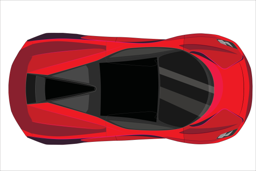

In [24]:
from fastdownload import download_url
dest = 'car.jpg'
download_url(urls[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256,256)

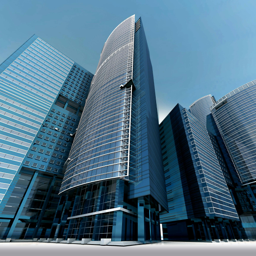

In [26]:
download_url(search_images('building photos', max_images=1)[0], 'building.jpg', show_progress=False)
Image.open('building.jpg').to_thumb(256,256)

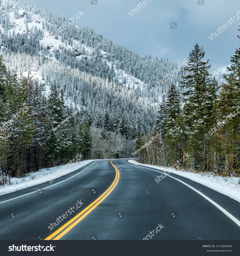

In [32]:
download_url(search_images('road photos', max_images=1)[0], 'road.jpg', show_progress=False)
Image.open('road.jpg').to_thumb(256,256)

In [33]:
from fastai.vision.all import *
from pathlib import Path

path = Path('my_dataset')
for folder in ['car', 'building', 'road']:
    (path/folder).mkdir(parents=True, exist_ok=True)

print("Created folders:")
print(path.ls())

Created folders:
[Path('my_dataset/building'), Path('my_dataset/car'), Path('my_dataset/road')]


In [37]:
urls = search_images('car photo', max_images=30)
download_images(path/'car', urls=urls)
print(f"Cars downloaded: {len(get_image_files(path/'car'))}")

Cars downloaded: 30


In [38]:
urls = search_images('building photo', max_images=30)
download_images(path/'building', urls=urls)
print(f"Buildings downloaded: {len(get_image_files(path/'building'))}")

Buildings downloaded: 26


In [48]:
urls = search_images('road photo', max_images=30)
download_images(path/'road', urls=urls)
print(f"Roads downloaded: {len(get_image_files(path/'road'))}")

Roads downloaded: 24


In [49]:
# Remove any corrupted downloads
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
print(f"Removed {len(failed)} broken images")

# Resize everything to the same size
for folder in ['car', 'building', 'road']:
    resize_images(path/folder, max_size=400, dest=path/folder)

total = len(get_image_files(path))
print(f"Total usable images: {total}")

Removed 1 broken images
Total usable images: 79


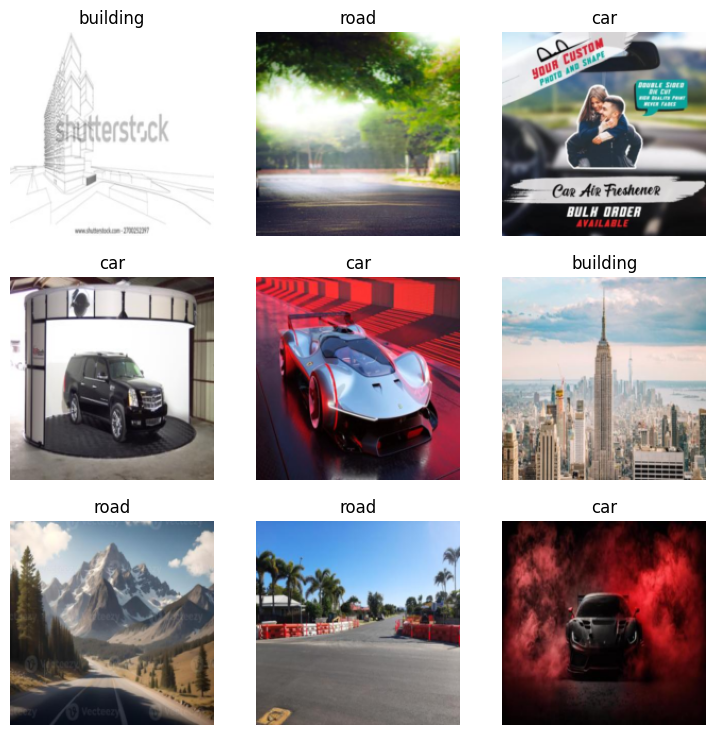

In [50]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),  # input is an image, output is a category
    get_items=get_image_files,           # how to find the images
    splitter=RandomSplitter(valid_pct=0.2, seed=42),  # 80% train, 20% test
    get_y=parent_label,                  # the label is the folder name
    item_tfms=Resize(192, method='squish')  # resize all images to same size
).dataloaders(path, bs=16)

dls.show_batch(max_n=9)

In [52]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,time
0,1.547832,0.915448,0.400000,00:06


epoch,train_loss,valid_loss,error_rate,time
0,0.760323,0.602646,0.266667,00:09
1,0.592745,0.548788,0.200000,00:08
2,0.431657,0.536239,0.200000,00:08


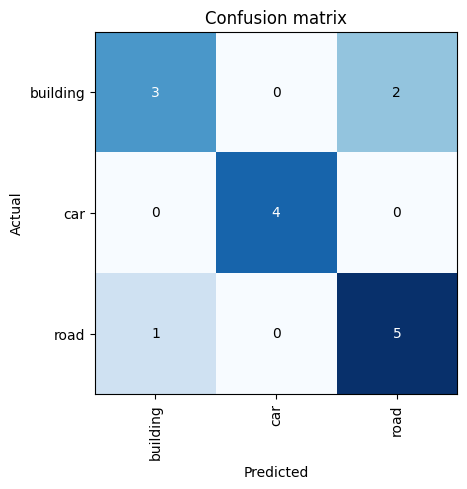

In [53]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

Prediction: car
Confidence:
  building: 0.0%
  car: 100.0%
  road: 0.0%


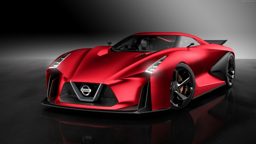

In [54]:
test_url = search_images('red sports car', max_images=1)[0]
download_url(test_url, 'test_car.jpg', show_progress=False)

img = PILImage.create('test_car.jpg')
category, idx, probs = learn.predict(img)

print(f"Prediction: {category}")
print(f"Confidence:")
for i, cat in enumerate(dls.vocab):
    print(f"  {cat}: {probs[i]:.1%}")

img.to_thumb(256, 256)

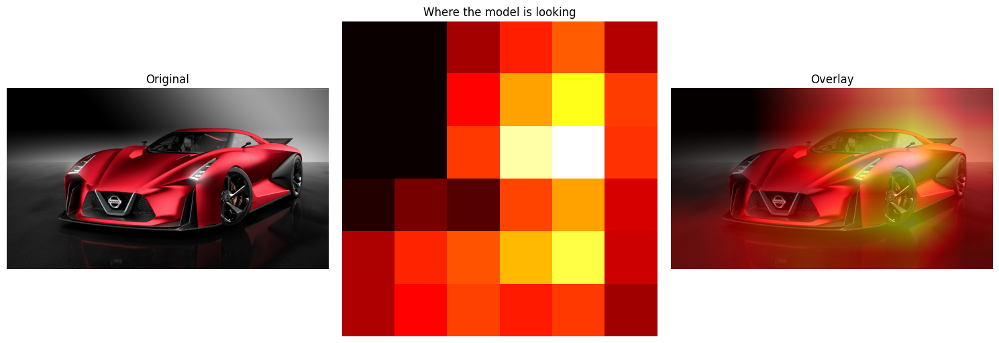

In [56]:
# Get a car image
img = PILImage.create('test_car.jpg')

# Get the model's activations
x, = first(dls.test_dl([img]))
hook_output = None

def hook_fn(module, input, output):
    global hook_output
    hook_output = output

# Hook into the last convolutional layer
hook = learn.model[0][-1].register_forward_hook(hook_fn)
with torch.no_grad():
    preds = learn.model(x)
hook.remove()

# Get the activation map for the predicted class
pred_class = preds.argmax(dim=1).item()
weights = learn.model[1][-1].weight[pred_class]

import torch.nn.functional as F

# Create the heatmap
cam = torch.zeros(hook_output.shape[2:])
for i, w in enumerate(weights):
    cam += w * hook_output[0, i]

cam = F.relu(cam)  # only positive activations
cam = cam / cam.max()  # normalize 0-1

# Display it
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img)
axes[0].set_title('Original')
axes[1].imshow(cam.detach().numpy(), cmap='hot')
axes[1].set_title('Where the model is looking')
cam_resized = F.interpolate(cam.detach().unsqueeze(0).unsqueeze(0), 
                             size=(img.height, img.width), 
                             mode='bilinear').squeeze().numpy()
axes[2].imshow(img)
axes[2].imshow(cam_resized, cmap='hot', alpha=0.5)
axes[2].set_title('Overlay')
for ax in axes:
    ax.axis('off')
plt.tight_layout()
plt.show()

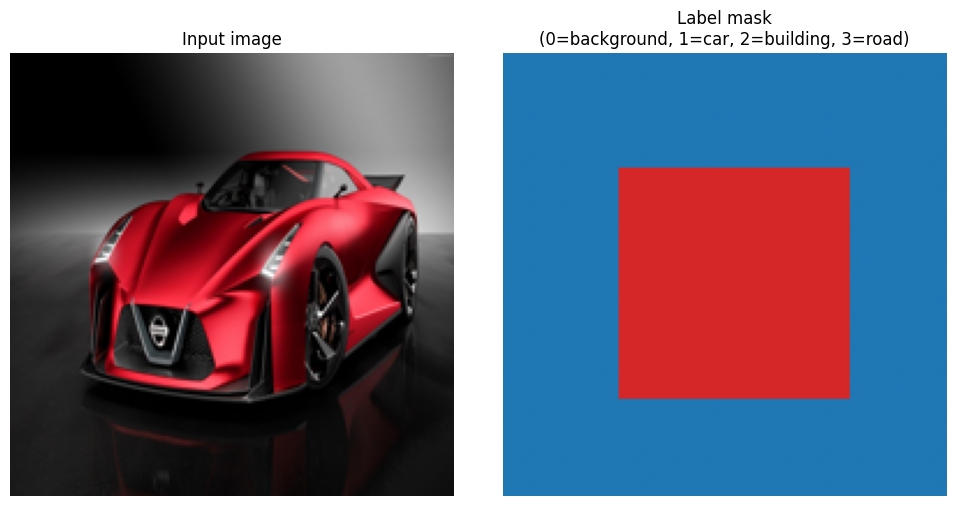

In [57]:
import numpy as np
from PIL import Image as PILImg

# Let's see what a segmentation label looks like
# It's an image the same size as the input, where each pixel value = category ID
# 0 = background, 1 = car, 2 = building, 3 = road

dummy = np.zeros((192, 192), dtype=np.uint8)
dummy[50:150, 50:150] = 1  # a square "car" in the middle

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(PILImg.open('test_car.jpg').resize((192,192)))
axes[0].set_title('Input image')
axes[1].imshow(dummy, cmap='tab10', vmin=0, vmax=3)
axes[1].set_title('Label mask\n(0=background, 1=car, 2=building, 3=road)')
for ax in axes:
    ax.axis('off')
plt.tight_layout()
plt.show()

In [58]:
path = untar_data(URLs.CAMVID_TINY)
print(path.ls())

<div><progress max="2314212" value="2318336"></progress> 100.18% [2318336/2314212 00:01&lt;00:00]</div>

[Path('C:/Users/DENIZ/.fastai/data/camvid_tiny/codes.txt'), Path('C:/Users/DENIZ/.fastai/data/camvid_tiny/images'), Path('C:/Users/DENIZ/.fastai/data/camvid_tiny/labels')]


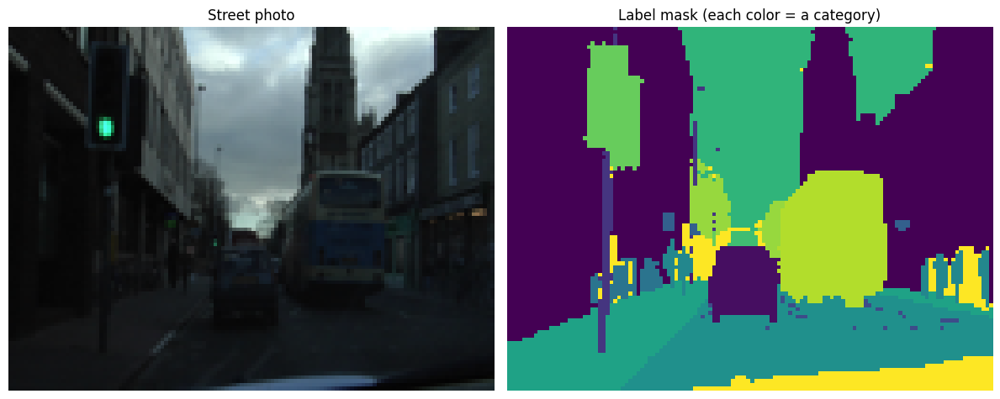

In [59]:
# See an image and its mask side by side
img_files = get_image_files(path/'images')
mask_files = get_image_files(path/'labels')

img = PILImg.open(img_files[0])
mask = PILImg.open(mask_files[0])

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img)
axes[0].set_title('Street photo')
axes[1].imshow(mask)
axes[1].set_title('Label mask (each color = a category)')
for ax in axes:
    ax.axis('off')
plt.tight_layout()
plt.show()

In [60]:
codes = np.loadtxt(path/'codes.txt', dtype=str)
print("Categories this dataset labels:")
for i, c in enumerate(codes):
    print(f"  {i}: {c}")

Categories this dataset labels:
  0: Animal
  1: Archway
  2: Bicyclist
  3: Bridge
  4: Building
  5: Car
  6: CartLuggagePram
  7: Child
  8: Column_Pole
  9: Fence
  10: LaneMkgsDriv
  11: LaneMkgsNonDriv
  12: Misc_Text
  13: MotorcycleScooter
  14: OtherMoving
  15: ParkingBlock
  16: Pedestrian
  17: Road
  18: RoadShoulder
  19: Sidewalk
  20: SignSymbol
  21: Sky
  22: SUVPickupTruck
  23: TrafficCone
  24: TrafficLight
  25: Train
  26: Tree
  27: Truck_Bus
  28: Tunnel
  29: VegetationMisc
  30: Void
  31: Wall


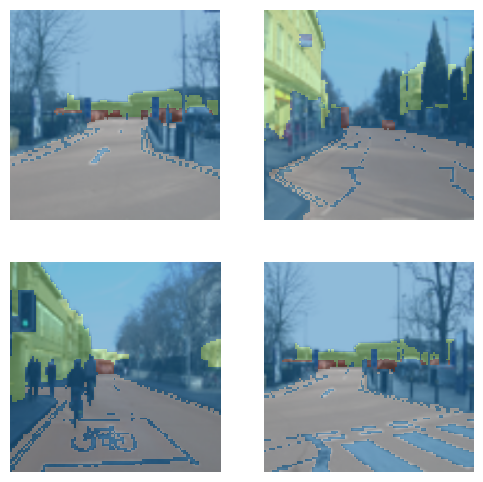

In [61]:
from fastai.vision.all import *
import numpy as np
from PIL import Image as PILImg

# Our simplified categories
new_codes = np.array(['background', 'building', 'car', 'road'])

# Mapping: original ID → new ID (everything else → 0 = background)
remap = np.zeros(32, dtype=np.uint8)  # default everything to 0
remap[4] = 1   # Building → 1
remap[5] = 2   # Car → 2
remap[22] = 2  # SUVPickupTruck → also car
remap[27] = 2  # Truck_Bus → also car
remap[17] = 3  # Road → 3

def label_func(fn):
    return path/'labels'/f'{fn.stem}_P{fn.suffix}'

class RemapMask(Transform):
    def encodes(self, x:TensorMask):
        return TensorMask(remap[x.long()])

dls = SegmentationDataLoaders.from_label_func(
    path,
    bs=8,
    fnames=get_image_files(path/'images'),
    label_func=label_func,
    codes=new_codes,
    item_tfms=Resize(224),
    batch_tfms=RemapMask(),
)

dls.show_batch(max_n=4)

In [63]:
learn = unet_learner(dls, resnet18, metrics=DiceMulti)
learn.fine_tune(8)

epoch,train_loss,valid_loss,dice_multi,time
0,1.407114,1.042532,0.389732,02:44


epoch,train_loss,valid_loss,dice_multi,time
0,0.823688,0.750475,0.508378,03:06
1,0.824556,0.761998,0.395675,02:34
2,0.761651,0.798430,0.503769,02:34
3,0.731280,0.606552,0.566566,03:36
4,0.674549,0.480133,0.609674,03:01
5,0.612764,0.420971,0.639764,02:51
6,0.558364,0.388536,0.640646,03:18
7,0.516407,0.388139,0.640623,03:15


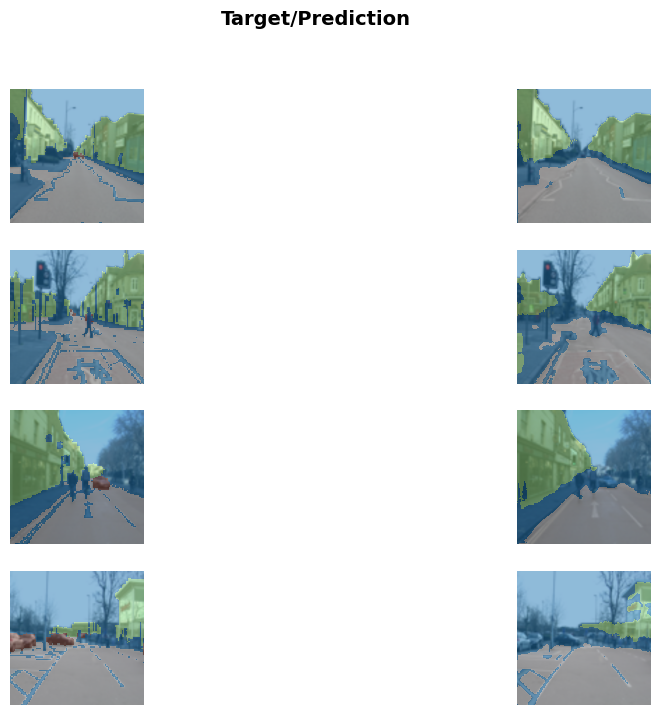

In [64]:
learn.show_results(max_n=4, figsize=(12, 8))

In [65]:
# Reload the classifier data
cls_path = Path('my_dataset')
cls_dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(192, method='squish')
).dataloaders(cls_path, bs=16)

cls_learn = vision_learner(cls_dls, resnet18, metrics=error_rate)
cls_learn.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,1.855613,1.915882,0.600000,00:06


epoch,train_loss,valid_loss,error_rate,time
0,0.946209,1.090065,0.466667,00:08
1,0.755603,0.810117,0.400000,00:07
2,0.558290,0.678467,0.266667,00:08
3,0.454512,0.744333,0.266667,00:09
4,0.368337,0.726058,0.266667,00:09
5,0.305790,0.643866,0.200000,00:08
6,0.254593,0.588176,0.200000,00:10
7,0.216533,0.572336,0.200000,00:10
8,0.189193,0.551182,0.200000,00:09
9,0.178958,0.557365,0.200000,00:10


In [67]:
def grid_segment(image_path, grid_size=16, alpha=0.5):
    """Split image into grid, classify each patch, color accordingly"""
    
    img = PILImg.open(image_path).convert('RGB')
    img_array = np.array(img)
    h, w = img_array.shape[:2]
    
    patch_h = h // grid_size
    patch_w = w // grid_size
    
    # Colors for each category
    colors = {
        'car': [255, 0, 0],        # red
        'building': [0, 255, 0],    # green
        'road': [0, 100, 255],      # blue
    }
    
    overlay = np.zeros_like(img_array)
    confidence_map = np.zeros((h, w))
    
    print(f"Classifying {grid_size}x{grid_size} = {grid_size**2} patches...")
    
    for row in range(grid_size):
        for col in range(grid_size):
            # Extract patch
            y1 = row * patch_h
            y2 = (row + 1) * patch_h if row < grid_size - 1 else h
            x1 = col * patch_w
            x2 = (col + 1) * patch_w if col < grid_size - 1 else w
            
            patch = img_array[y1:y2, x1:x2]
            patch_img = PILImage.create(PILImg.fromarray(patch))
            
            # Classify this patch
            with cls_learn.no_bar():
                category, idx, probs = cls_learn.predict(patch_img)
            
            conf = float(probs.max())
            overlay[y1:y2, x1:x2] = colors[category]
            confidence_map[y1:y2, x1:x2] = conf
    
    # Blend
    blended = (img_array * (1 - alpha) + overlay * alpha).astype(np.uint8)
    
    # Show results
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img_array)
    axes[0].set_title('Original')
    axes[1].imshow(overlay)
    axes[1].set_title(f'Grid Classification ({grid_size}x{grid_size})\nRed=Car, Green=Building, Blue=Road')
    axes[2].imshow(blended)
    axes[2].set_title('Overlay')
    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    print("Done!")

Classifying 6x6 = 36 patches...


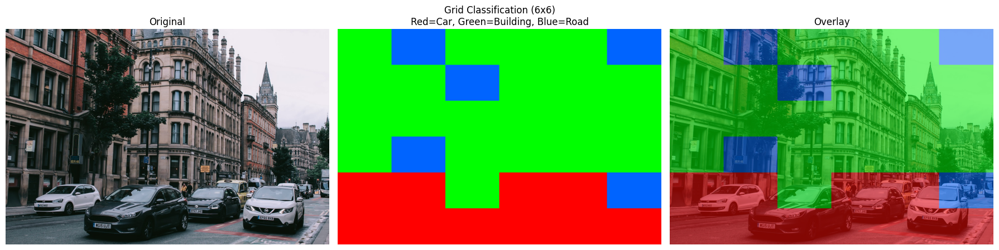

Done!


In [79]:
# Download a street scene to test both approaches
test_url = search_images('city street with cars and buildings', max_images=1)[0]
download_url(test_url, 'street_test.jpg', show_progress=False)

grid_segment('street_test.jpg', grid_size=6)

Running grid size 4x4 (16 patches)...
Running grid size 6x6 (36 patches)...
Running grid size 8x8 (64 patches)...
Running grid size 10x10 (100 patches)...
Running grid size 12x12 (144 patches)...


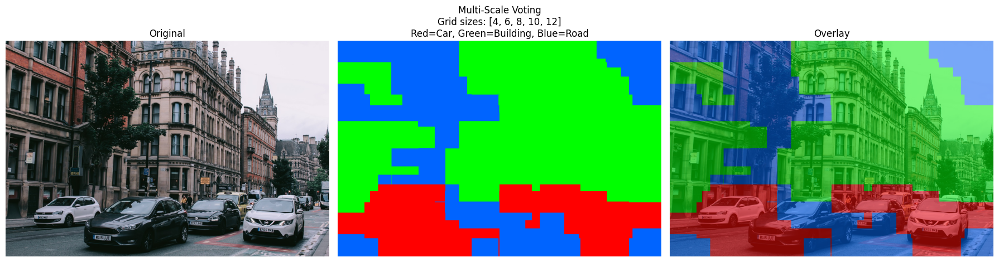

In [80]:
def grid_segment_multiscale(image_path, grid_sizes=[4, 6, 8, 10, 12], alpha=0.5):
    img = PILImg.open(image_path).convert('RGB')
    img_array = np.array(img)
    h, w = img_array.shape[:2]
    
    cat_to_id = {'building': 1, 'car': 2, 'road': 3}
    colors = {
        0: [128, 128, 128],  # no strong vote - gray
        1: [0, 255, 0],      # building - green
        2: [255, 0, 0],      # car - red
        3: [0, 100, 255],    # road - blue
    }
    
    # Accumulate votes: for each pixel, count how many times each category won
    votes = np.zeros((h, w, 4))  # 4 categories (0=background placeholder, 1=building, 2=car, 3=road)
    
    for gs in grid_sizes:
        print(f"Running grid size {gs}x{gs} ({gs**2} patches)...")
        patch_h = h // gs
        patch_w = w // gs
        
        for row in range(gs):
            for col in range(gs):
                y1 = row * patch_h
                y2 = (row + 1) * patch_h if row < gs - 1 else h
                x1 = col * patch_w
                x2 = (col + 1) * patch_w if col < gs - 1 else w
                
                patch = PILImage.create(PILImg.fromarray(img_array[y1:y2, x1:x2]))
                with cls_learn.no_bar():
                    category, idx, probs = cls_learn.predict(patch)
                
                conf = float(probs.max())
                cat_id = cat_to_id[category]
                # Weight the vote by confidence
                votes[y1:y2, x1:x2, cat_id] += conf
    
    # Winner takes all - pick the category with most votes per pixel
    final_mask = votes[:, :, 1:].argmax(axis=2) + 1  # +1 because we skip index 0
    
    # Build the overlay
    overlay = np.zeros_like(img_array)
    for cat_id, color in colors.items():
        if cat_id == 0:
            continue
        overlay[final_mask == cat_id] = color
    
    blended = (img_array * (1 - alpha) + overlay * alpha).astype(np.uint8)
    
    # Also show individual scales for comparison
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img_array)
    axes[0].set_title('Original')
    axes[1].imshow(overlay)
    axes[1].set_title(f'Multi-Scale Voting\nGrid sizes: {grid_sizes}\nRed=Car, Green=Building, Blue=Road')
    axes[2].imshow(blended)
    axes[2].set_title('Overlay')
    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    return votes, final_mask

votes, mask = grid_segment_multiscale('street_test.jpg')

In [81]:
def sliding_window_segment(image_path, window_size=64, stride=16, alpha=0.5):
    img = PILImg.open(image_path).convert('RGB')
    img_array = np.array(img)
    h, w = img_array.shape[:2]
    
    cat_to_id = {'building': 1, 'car': 2, 'road': 3}
    colors = {1: [0,255,0], 2: [255,0,0], 3: [0,100,255]}
    
    votes = np.zeros((h, w, 4), dtype=np.float32)
    
    total = ((h - window_size) // stride + 1) * ((w - window_size) // stride + 1)
    count = 0
    
    for y in range(0, h - window_size, stride):
        for x in range(0, w - window_size, stride):
            patch = img_array[y:y+window_size, x:x+window_size]
            patch_img = PILImage.create(PILImg.fromarray(patch))
            
            with cls_learn.no_bar():
                category, idx, probs = cls_learn.predict(patch_img)
            
            conf = float(probs.max())
            cat_id = cat_to_id[category]
            votes[y:y+window_size, x:x+window_size, cat_id] += conf
            
            count += 1
            if count % 100 == 0:
                print(f"Progress: {count}/{total} patches ({100*count//total}%)")
    
    final_mask = votes[:,:,1:].argmax(axis=2) + 1
    
    overlay = np.zeros_like(img_array)
    for cat_id, color in colors.items():
        overlay[final_mask == cat_id] = color
    
    blended = (img_array * (1-alpha) + overlay * alpha).astype(np.uint8)
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img_array)
    axes[0].set_title('Original')
    axes[1].imshow(overlay)
    axes[1].set_title(f'Sliding Window\nwindow={window_size}px, stride={stride}px\nRed=Car, Green=Building, Blue=Road')
    axes[2].imshow(blended)
    axes[2].set_title('Overlay')
    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

Progress: 100/975 patches (10%)
Progress: 200/975 patches (20%)
Progress: 300/975 patches (30%)
Progress: 400/975 patches (41%)
Progress: 500/975 patches (51%)
Progress: 600/975 patches (61%)
Progress: 700/975 patches (71%)
Progress: 800/975 patches (82%)
Progress: 900/975 patches (92%)


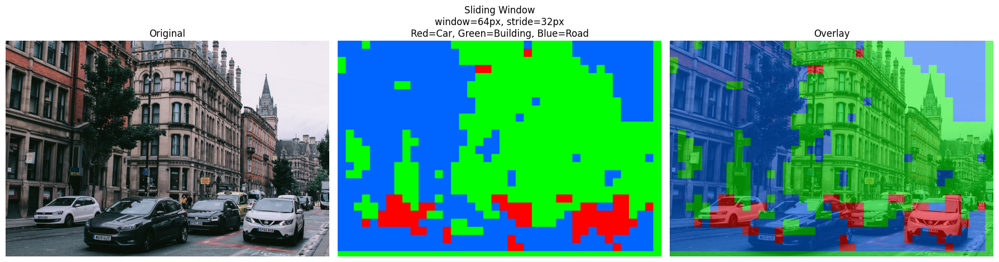

In [83]:
sliding_window_segment('street_test.jpg', window_size=64, stride=32)

Grid 4x4...
Grid 6x6...
Grid 8x8...
Grid 10x10...
Grid 12x12...
Sliding window (975 patches)...
  Sliding window progress: 20%
  Sliding window progress: 41%
  Sliding window progress: 61%
  Sliding window progress: 82%


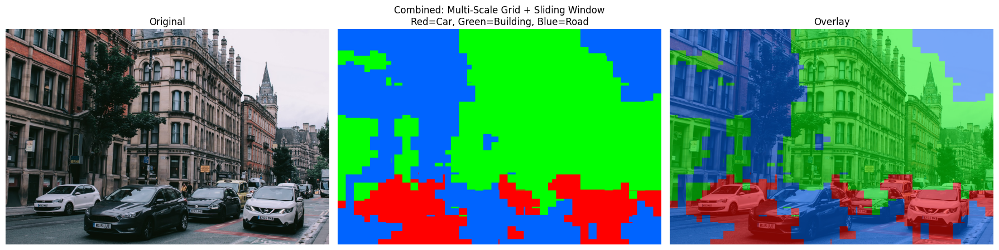

In [84]:
def combined_segment(image_path, grid_sizes=[4,6,8,10,12], 
                     window_size=64, stride=32, alpha=0.5):
    img = PILImg.open(image_path).convert('RGB')
    img_array = np.array(img)
    h, w = img_array.shape[:2]
    
    cat_to_id = {'building': 1, 'car': 2, 'road': 3}
    colors = {1: [0,255,0], 2: [255,0,0], 3: [0,100,255]}
    
    votes = np.zeros((h, w, 4), dtype=np.float32)
    
    # --- Part 1: Multi-scale grid voting ---
    for gs in grid_sizes:
        print(f"Grid {gs}x{gs}...")
        patch_h, patch_w = h // gs, w // gs
        for row in range(gs):
            for col in range(gs):
                y1 = row * patch_h
                y2 = (row+1) * patch_h if row < gs-1 else h
                x1 = col * patch_w
                x2 = (col+1) * patch_w if col < gs-1 else w
                
                patch = PILImage.create(PILImg.fromarray(img_array[y1:y2, x1:x2]))
                with cls_learn.no_bar():
                    cat, idx, probs = cls_learn.predict(patch)
                conf = float(probs.max())
                votes[y1:y2, x1:x2, cat_to_id[cat]] += conf
    
    # --- Part 2: Sliding window ---
    total = ((h - window_size) // stride + 1) * ((w - window_size) // stride + 1)
    count = 0
    print(f"Sliding window ({total} patches)...")
    
    for y in range(0, h - window_size, stride):
        for x in range(0, w - window_size, stride):
            patch = PILImage.create(PILImg.fromarray(
                img_array[y:y+window_size, x:x+window_size]))
            with cls_learn.no_bar():
                cat, idx, probs = cls_learn.predict(patch)
            conf = float(probs.max())
            votes[y:y+window_size, x:x+window_size, cat_to_id[cat]] += conf
            
            count += 1
            if count % 200 == 0:
                print(f"  Sliding window progress: {100*count//total}%")
    
    final_mask = votes[:,:,1:].argmax(axis=2) + 1
    
    overlay = np.zeros_like(img_array)
    for cat_id, color in colors.items():
        overlay[final_mask == cat_id] = color
    
    blended = (img_array * (1-alpha) + overlay * alpha).astype(np.uint8)
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img_array)
    axes[0].set_title('Original')
    axes[1].imshow(overlay)
    axes[1].set_title('Combined: Multi-Scale Grid + Sliding Window\nRed=Car, Green=Building, Blue=Road')
    axes[2].imshow(blended)
    axes[2].set_title('Overlay')
    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    return votes, final_mask

votes, mask = combined_segment('street_test.jpg')

Square: 234 patches done
Tall: 242 patches done
Wide: 256 patches done


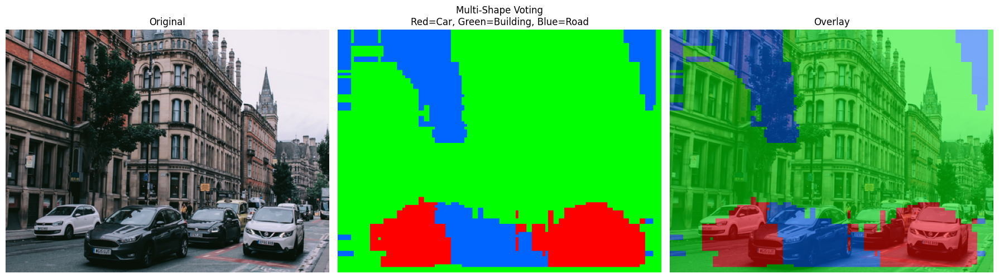

In [87]:
def advanced_segment(image_path, alpha=0.5):
    img = PILImg.open(image_path).convert('RGB').resize((480, 360))
    img_array = np.array(img)
    h, w = img_array.shape[:2]
    
    cat_to_id = {'building': 1, 'car': 2, 'road': 3}
    colors = {1: [0,255,0], 2: [255,0,0], 3: [0,100,255]}
    
    votes = np.zeros((h, w, 4), dtype=np.float32)
    
    window_configs = [
        (64, 64, 24, 24, "Square"),
        (96, 48, 24, 20, "Tall"),
        (48, 96, 20, 24, "Wide"),
    ]
    
    for wh, ww, sy, sx, name in window_configs:
        count = 0
        for y in range(0, h - wh, sy):
            for x in range(0, w - ww, sx):
                patch = PILImage.create(PILImg.fromarray(img_array[y:y+wh, x:x+ww]))
                with cls_learn.no_bar():
                    cat, idx, probs = cls_learn.predict(patch)
                conf = float(probs.max())
                votes[y:y+wh, x:x+ww, cat_to_id[cat]] += conf
                count += 1
        print(f"{name}: {count} patches done")
    
    final_mask = votes[:,:,1:].argmax(axis=2) + 1
    
    overlay = np.zeros_like(img_array)
    for cat_id, color in colors.items():
        overlay[final_mask == cat_id] = color
    
    blended = (img_array * (1-alpha) + overlay * alpha).astype(np.uint8)
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img_array)
    axes[0].set_title('Original')
    axes[1].imshow(overlay)
    axes[1].set_title('Multi-Shape Voting\nRed=Car, Green=Building, Blue=Road')
    axes[2].imshow(blended)
    axes[2].set_title('Overlay')
    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

advanced_segment('street_test.jpg')

=== Method 1: Multi-scale grid ===
  Grid 4x4 done
  Grid 6x6 done
  Grid 8x8 done
  Grid 10x10 done
=== Method 2: Sliding window ===
  234 patches done
=== Method 3: Shaped windows ===
  Tall: 180 patches done
  Wide: 182 patches done
=== Building final result ===


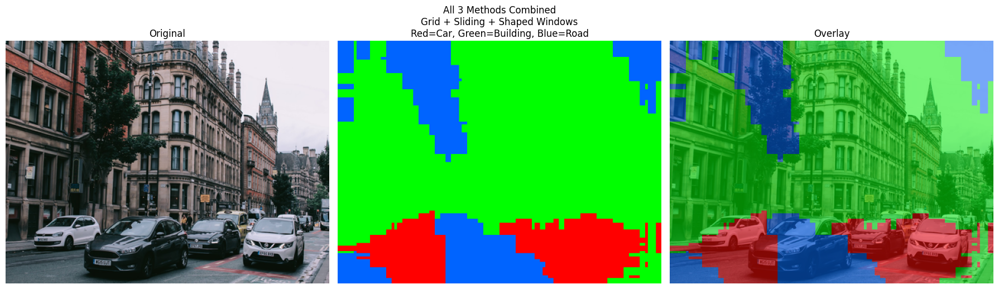

In [88]:
def ultimate_segment(image_path, alpha=0.5):
    img = PILImg.open(image_path).convert('RGB').resize((480, 360))
    img_array = np.array(img)
    h, w = img_array.shape[:2]
    
    cat_to_id = {'building': 1, 'car': 2, 'road': 3}
    colors = {1: [0,255,0], 2: [255,0,0], 3: [0,100,255]}
    
    votes = np.zeros((h, w, 4), dtype=np.float32)
    
    # --- Method 1: Multi-scale grid ---
    print("=== Method 1: Multi-scale grid ===")
    for gs in [4, 6, 8, 10]:
        patch_h, patch_w = h // gs, w // gs
        for row in range(gs):
            for col in range(gs):
                y1 = row * patch_h
                y2 = (row+1) * patch_h if row < gs-1 else h
                x1 = col * patch_w
                x2 = (col+1) * patch_w if col < gs-1 else w
                
                patch = PILImage.create(PILImg.fromarray(img_array[y1:y2, x1:x2]))
                with cls_learn.no_bar():
                    cat, idx, probs = cls_learn.predict(patch)
                votes[y1:y2, x1:x2, cat_to_id[cat]] += float(probs.max())
        print(f"  Grid {gs}x{gs} done")
    
    # --- Method 2: Square sliding window ---
    print("=== Method 2: Sliding window ===")
    count = 0
    for y in range(0, h - 64, 24):
        for x in range(0, w - 64, 24):
            patch = PILImage.create(PILImg.fromarray(img_array[y:y+64, x:x+64]))
            with cls_learn.no_bar():
                cat, idx, probs = cls_learn.predict(patch)
            votes[y:y+64, x:x+64, cat_to_id[cat]] += float(probs.max())
            count += 1
    print(f"  {count} patches done")
    
    # --- Method 3: Tall + Wide windows ---
    print("=== Method 3: Shaped windows ===")
    for wh, ww, sy, sx, name in [(96, 48, 28, 24, "Tall"), (48, 96, 24, 28, "Wide")]:
        count = 0
        for y in range(0, h - wh, sy):
            for x in range(0, w - ww, sx):
                patch = PILImage.create(PILImg.fromarray(img_array[y:y+wh, x:x+ww]))
                with cls_learn.no_bar():
                    cat, idx, probs = cls_learn.predict(patch)
                votes[y:y+wh, x:x+ww, cat_to_id[cat]] += float(probs.max())
                count += 1
        print(f"  {name}: {count} patches done")
    
    print("=== Building final result ===")
    final_mask = votes[:,:,1:].argmax(axis=2) + 1
    
    overlay = np.zeros_like(img_array)
    for cat_id, color in colors.items():
        overlay[final_mask == cat_id] = color
    
    blended = (img_array * (1-alpha) + overlay * alpha).astype(np.uint8)
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img_array)
    axes[0].set_title('Original')
    axes[1].imshow(overlay)
    axes[1].set_title('All 3 Methods Combined\nGrid + Sliding + Shaped Windows\nRed=Car, Green=Building, Blue=Road')
    axes[2].imshow(blended)
    axes[2].set_title('Overlay')
    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    return votes, final_mask

votes, mask = ultimate_segment('street_test.jpg')

In [90]:
# Reload U-Net
seg_path = untar_data(URLs.CAMVID_TINY)

seg_dls = SegmentationDataLoaders.from_label_func(
    seg_path,
    bs=8,
    fnames=get_image_files(seg_path/'images'),
    label_func=lambda fn: seg_path/'labels'/f'{fn.stem}_P{fn.suffix}',
    codes=new_codes,
    item_tfms=Resize(224),
    batch_tfms=RemapMask(),
)

seg_learn = unet_learner(seg_dls, resnet18, metrics=DiceMulti)
seg_learn.fine_tune(5)
print("U-Net ready!")

epoch,train_loss,valid_loss,dice_multi,time
0,1.242318,1.078305,0.310918,02:59


epoch,train_loss,valid_loss,dice_multi,time
0,0.853093,0.845693,0.506084,03:46
1,0.844079,0.735610,0.398223,02:44
2,0.797837,0.566356,0.548948,03:28
3,0.732757,0.563450,0.562873,03:54
4,0.676000,0.515810,0.590770,03:42


U-Net ready!


Running your custom 3-method approach...
  Grid done
  Sliding window done
  Shaped windows done
Running U-Net...
  U-Net done


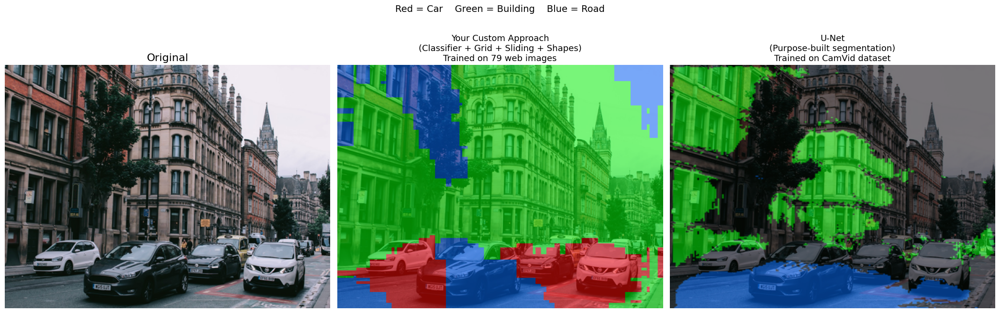

In [91]:
def final_comparison(image_path):
    img = PILImg.open(image_path).convert('RGB')
    original = np.array(img)
    
    # --- Your custom approach ---
    print("Running your custom 3-method approach...")
    img_resized = img.resize((480, 360))
    img_array = np.array(img_resized)
    h, w = img_array.shape[:2]
    
    cat_to_id = {'building': 1, 'car': 2, 'road': 3}
    colors = {1: [0,255,0], 2: [255,0,0], 3: [0,100,255]}
    votes = np.zeros((h, w, 4), dtype=np.float32)
    
    # Grid
    for gs in [4, 6, 8, 10]:
        ph, pw = h // gs, w // gs
        for row in range(gs):
            for col in range(gs):
                y1, y2 = row*ph, (row+1)*ph if row < gs-1 else h
                x1, x2 = col*pw, (col+1)*pw if col < gs-1 else w
                patch = PILImage.create(PILImg.fromarray(img_array[y1:y2, x1:x2]))
                with cls_learn.no_bar():
                    cat, idx, probs = cls_learn.predict(patch)
                votes[y1:y2, x1:x2, cat_to_id[cat]] += float(probs.max())
    print("  Grid done")
    
    # Sliding window
    for y in range(0, h-64, 24):
        for x in range(0, w-64, 24):
            patch = PILImage.create(PILImg.fromarray(img_array[y:y+64, x:x+64]))
            with cls_learn.no_bar():
                cat, idx, probs = cls_learn.predict(patch)
            votes[y:y+64, x:x+64, cat_to_id[cat]] += float(probs.max())
    print("  Sliding window done")
    
    # Shaped windows
    for wh, ww, sy, sx in [(96,48,28,24), (48,96,24,28)]:
        for y in range(0, h-wh, sy):
            for x in range(0, w-ww, sx):
                patch = PILImage.create(PILImg.fromarray(img_array[y:y+wh, x:x+ww]))
                with cls_learn.no_bar():
                    cat, idx, probs = cls_learn.predict(patch)
                votes[y:y+wh, x:x+ww, cat_to_id[cat]] += float(probs.max())
    print("  Shaped windows done")
    
    custom_mask = votes[:,:,1:].argmax(axis=2) + 1
    custom_overlay = np.zeros_like(img_array)
    for cat_id, color in colors.items():
        custom_overlay[custom_mask == cat_id] = color
    custom_blend = (img_array * 0.5 + custom_overlay * 0.5).astype(np.uint8)
    
    # --- U-Net approach ---
    print("Running U-Net...")
    unet_img = img.resize((224, 224))
    img_tensor = TensorImage(torch.tensor(np.array(unet_img)).permute(2,0,1).float() / 255.0)
    
    with torch.no_grad():
        pred = seg_learn.model(img_tensor.unsqueeze(0))
    unet_mask = pred.argmax(dim=1).squeeze().numpy()
    
    unet_overlay = np.zeros((*unet_mask.shape, 3), dtype=np.uint8)
    for cat_id, color in colors.items():
        unet_overlay[unet_mask == cat_id] = color
    
    unet_resized = np.array(PILImg.fromarray(unet_overlay).resize((w, h)))
    unet_blend = (img_array * 0.5 + unet_resized * 0.5).astype(np.uint8)
    print("  U-Net done")
    
    # --- Show comparison ---
    fig, axes = plt.subplots(1, 3, figsize=(21, 7))
    axes[0].imshow(np.array(img.resize((480, 360))))
    axes[0].set_title('Original', fontsize=16)
    axes[1].imshow(custom_blend)
    axes[1].set_title('Your Custom Approach\n(Classifier + Grid + Sliding + Shapes)\nTrained on 79 web images', fontsize=13)
    axes[2].imshow(unet_blend)
    axes[2].set_title('U-Net\n(Purpose-built segmentation)\nTrained on CamVid dataset', fontsize=13)
    for ax in axes:
        ax.axis('off')
    plt.suptitle('Red = Car    Green = Building    Blue = Road', fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

final_comparison('street_test.jpg')

In [92]:
# Save the classifier
cls_learn.export('car_building_road_classifier.pkl')

# Save the U-Net
seg_learn.export('unet_segmentation.pkl')

print("Both models saved!")
print("To load them later:")
print("  cls_learn = load_learner('car_building_road_classifier.pkl')")
print("  seg_learn = load_learner('unet_segmentation.pkl')")

Both models saved!
To load them later:
  cls_learn = load_learner('car_building_road_classifier.pkl')
  seg_learn = load_learner('unet_segmentation.pkl')
